# Improve the accuracy and efficiency of the tracking

There are two major issues that limits the use of the current tracking code:

- Accuracy: the separation between black and white is not satisfactory; when finding white particles, many false positives are detected.
- Efficiency: on a larger image, the code runs very slowly (e.g. it took me 3 min for a 2048x555 image)

In this notebook, we try to improve the performance of the tracking code in these two aspects. 

In [404]:
from skimage import io, measure, draw
import matplotlib.pyplot as plt
from bwtrack import *
from matplotlib.patches import Circle
from matplotlib.collections import PatchCollection
import time
from myImageLib import bestcolor

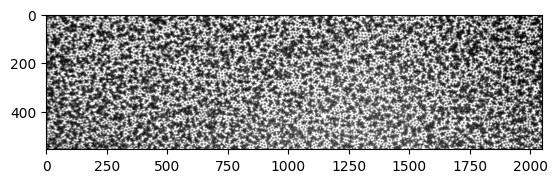

In [2]:
img = io.imread("large.tif")
plt.imshow(img, cmap="gray")

## 0 Run original code

So we can compare with, and see if it is improved or not.

### 0.1 Find bw on the large image

In [3]:
%%time
black = find_black(img, size=7)
black = min_dist_criterion(black, 7)
white = find_white(img, size=7)

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: invalid value encountered in divide
  out = out / np.sqrt(image * template)


CPU times: total: 3min 5s
Wall time: 3min 9s


<font color="blue"> It would be nice to avoid this warning of "divided by zero". </font>

### 0.2 Plot particle locations

CPU times: total: 37 s
Wall time: 37.3 s


(-0.5, 2047.5, 554.5, -0.5)

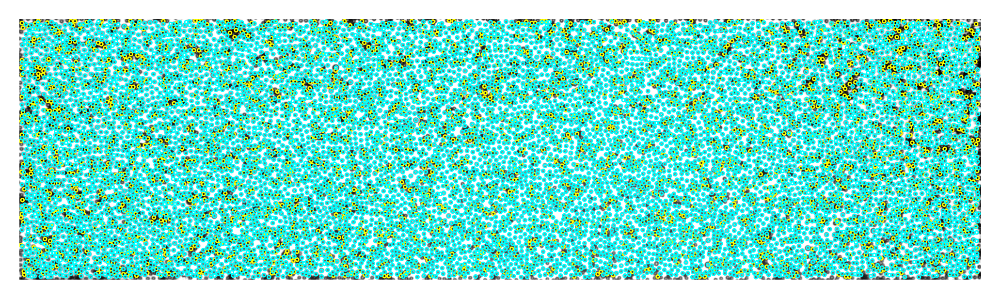

In [9]:
%%time
fig, ax = plt.subplots(dpi=400)
ax.imshow(img, cmap="gray")
for num, i in black.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="yellow", fill=False, lw=0.5)
    ax.add_patch(circ)
for num, i in white.iterrows():
    circ = Circle((i.x, i.y), radius=3.5, ec="cyan", fill=False, lw=0.5)
    ax.add_patch(circ)
ax.axis("off")

A faster way to plot many circles using `PatchCollection`. See [ref](https://stackoverflow.com/questions/48172928/scale-matplotlib-pyplot-axes-scatter-markersize-by-x-scale/48174228#48174228).

CPU times: total: 1.28 s
Wall time: 1.28 s


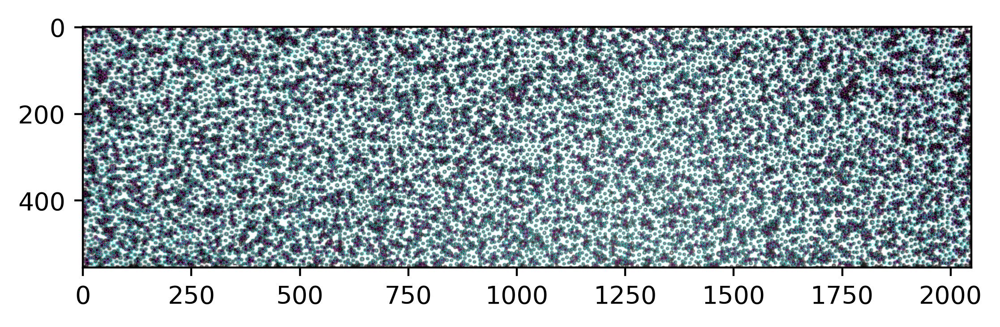

In [221]:
%%time
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=.1, fill=False, ec="magenta") for xi, yi in zip(black.x, black.y)]
b = PatchCollection(b_circ, match_original=True)
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=.1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=400)
ax.imshow(img, cmap="gray")
ax.add_collection(b)
ax.add_collection(w)

The `Circle` patch plot takes 37 s, while `PatchCollection` plot takes 1.28 ms. Plotting efficiency is improved a lot. 

In [91]:
# save results
p = [black.assign(bw="black"), white.assign(bw="white")]
particles = pd.concat(p)
particles.to_csv("results_v0.csv", index=False)

### 0.3 Take a small area for this test

In the whole image, it is not easy to see clearly which detections are problematic. After careful inspection, I find the right side (x>1800) to have bad detection quality. So we crop a 100x100 window in the upper right corner and test new code here. 

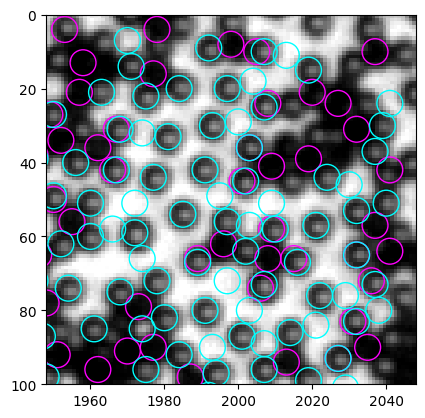

In [223]:
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black.x, black.y)]
b = PatchCollection(b_circ, match_original=True)
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(b)
ax.add_collection(w)

We see the problems clearly in this cropped image. 
- Some particles are identified as both black and white 
- some empty regions are identified as white particles

## 1 Improve accuracy

### 1.1 Misclassification of black and white

#### 1.1.1 What's wrong with mean intensity?

White particles are sometimes recognized as black in the example above. This is likely due to the inproper `thres` value. Indeed, although we determined `thres=3500` by looking at the "mass" (intensity sum) histogram for the first example, this histogram is not part of the routine. As a result, when dealing with other images, where imaging conditions and preproccessings are modified, the old method fails. 

Let's first check what goes wrong with mean intensity.

In [227]:
mask_b = np.zeros(img.shape)
for num, i in black.iterrows():
    rr, cc = draw.disk((i.y, i.x), 3)
    mask_b[rr, cc] = 1

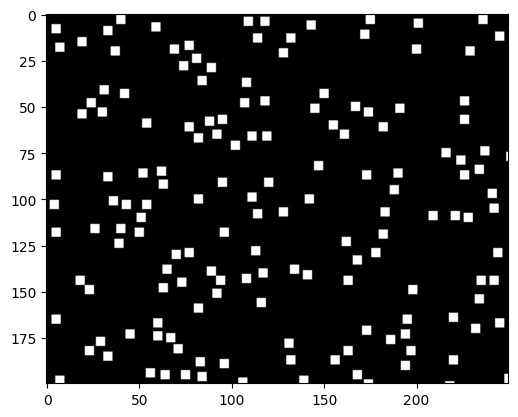

In [228]:
plt.imshow(mask_b[0:200, 0:250], cmap="gray")

Now, in `mask_b`, all the detected black particles are marked as white disks. This is a mask that allows us to label and the regions where we detect black particles using `skiamge.measure`.

In [229]:
label_img = measure.label(mask_b)
regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "intensity_mean")) # use raw image for computing properties

`regions` is a dict object, containing the properties of all the regions listed in the arrays. For example, here we ask `measure.regionprops_table()` to return labels, positions and mean intensity of all the regions by passing `properties=("label", "centroid", "intensity_mean")` to the method, and we get a dict of {label, centroid-0, centroid-1, intensity_mean}.

This dict can be passed directly to `pd.DataFrame()` to construct a table. 

In [238]:
table = pd.DataFrame(regions)
table.head()

,label,centroid-0,centroid-1,intensity_mean
0,1,3.0,40.0,21.12
1,2,3.0,175.0,76.48
2,3,3.0,236.0,21.76
3,4,3.0,374.0,53.44
4,5,3.0,381.0,17.12


Now, we can visualize the mean intensity histogram.

<AxesSubplot: >

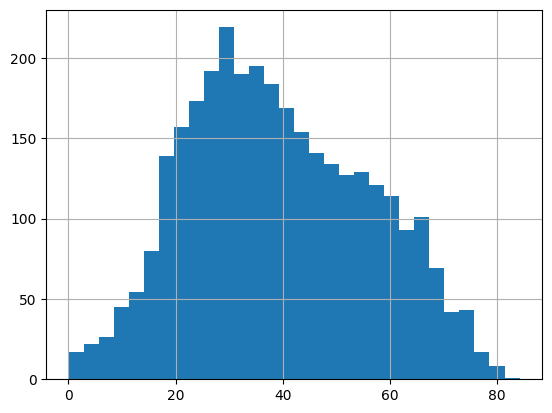

In [231]:
table["intensity_mean"].hist(bins=30)

Unfortunately, we don't observe clear separation between dark and bright features (for the whole image). Actually, we can still see clear difference in mean intensity between black and white particles **in a local region**. For example, below we plot all detected black particles in the 100x100 corner.

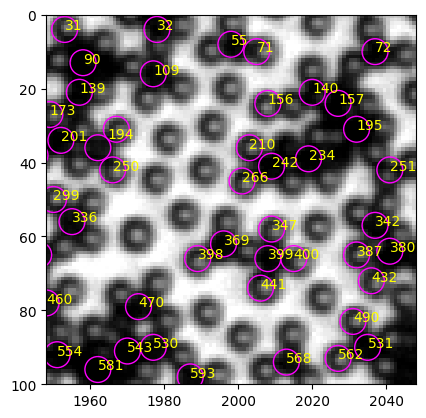

In [242]:
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black.x, black.y)]
b = PatchCollection(b_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(b)
for num, i in table.iterrows():
    ax.annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="yellow")

In the region shown above, particle#242 is a typical black, and particle#210 is a typical white. They are close to each other, so the local light condition should be similar. Let's look at their mean intensity. 

In [239]:
table.query("label in [242, 210]")

,label,centroid-0,centroid-1,intensity_mean
209,210,36.0,2003.0,58.20
241,242,41.0,2009.0,2.04


The black particle mean intensity is just 2.04, while the white mean intensity is 58.20 ! Does this mean we can set the mean intensity threshold to be very small, like 5? We need to check a black particle in a region where light is stronger, e.g. the center of the image. Let's look at a crop (1000, 1100, 300, 200).

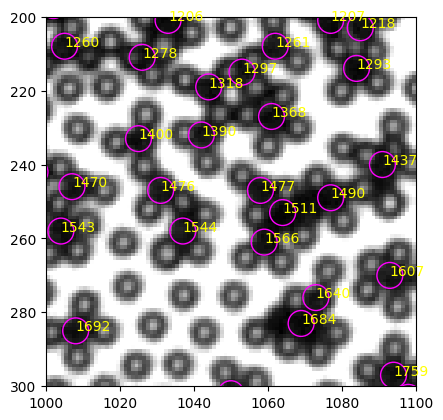

In [244]:
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black.x, black.y)]
b = PatchCollection(b_circ, match_original=True)
left, right, bottom, top = 1000, 1100, 300, 200
fig, ax = plt.subplots(dpi=100)
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(b)
for num, i in table.iterrows():
    ax.annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="yellow")

A typical black particle#1566 

In [245]:
table.query("label in [1566]")

,label,centroid-0,centroid-1,intensity_mean
1565,1566,261.0,1059.0,43.16


The mean intensity is 43.16, much larger than the black in the corner (2.04). It is also close to a white particle mean intensity in the corner. The illumination inhomogeneity is exactly the reason why we no longer see the separation in the mean intensity (or total mass to be more exact) like in smaller images. And that leads to the misclassification of black and white in the original method. 

#### 1.1.2 Seek better criteria

Mean intensity fails, so what can we do? Natural answer is let's look at other properties of black and white particles and see if there are criteria better than mean intensity. 

##### Standard deviation

I realize that most white particles have large intensity gradient compared to black particles. As a result, if I compute the standard deviation $\sigma$ of pixel intensities in a particle, we should have
$$
\sigma_b \ll \sigma_w
$$

In [249]:
label_img = measure.label(mask_b)
regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "image_intensity")) # use raw image for computing properties

In [250]:
table = pd.DataFrame(regions)
table.head()

,label,centroid-0,centroid-1,image_intensity
0,1,3.0,40.0,"[[7, 5, 11, 14, 17], [11, 13, 16, 23, 16], [13..."
1,2,3.0,175.0,"[[51, 43, 33, 23, 33], [68, 70, 65, 61, 55], [..."
2,3,3.0,236.0,"[[10, 10, 8, 8, 17], [14, 16, 13, 8, 33], [16,..."
3,4,3.0,374.0,"[[46, 33, 20, 7, 8], [80, 59, 38, 21, 13], [11..."
4,5,3.0,381.0,"[[4, 2, 7, 16, 19], [10, 5, 8, 20, 19], [8, 8,..."


The `image_intensity` column has the pixel information inside each particle feature. An example of particle#1 is shown below.

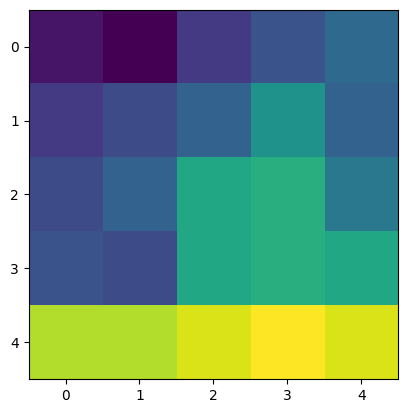

In [253]:
plt.imshow(table.loc[0, "image_intensity"])

Let's compute the pixel standard deviations of all the features. 

In [254]:
table["stdev"] = table["image_intensity"].map(np.std)

Then, let's review the selected particles again:

In [256]:
table.query("label in [242, 210, 1566]")

,label,centroid-0,centroid-1,image_intensity,stdev
209,210,36.0,2003.0,"[[32, 33, 46, 42, 55], [46, 77, 102, 81, 67], ...",29.223278
241,242,41.0,2009.0,"[[0, 0, 0, 0, 1], [1, 0, 0, 0, 0], [0, 0, 0, 0...",2.778201
1565,1566,261.0,1059.0,"[[52, 38, 43, 43, 33], [52, 42, 42, 39, 33], [...",4.838843


Particle#1566 shows small standard deviation, a good sign. Let's look at the distribution of standard deviation throughout the whole image.

<AxesSubplot: >

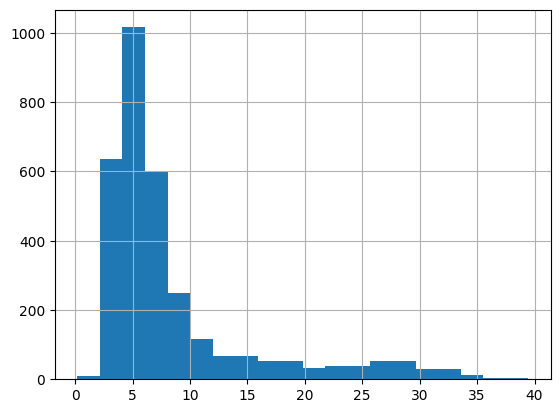

In [258]:
table["stdev"].hist(bins=20)

I still don't see two peaks. This might be because I only look at the detected black particles, so not many white particles are in this data set!

If I include the white particles too:

In [261]:
mask_bw = np.zeros(img.shape)
for num, i in pd.concat([black, white]).iterrows():
    rr, cc = draw.disk((i.y, i.x), 3)
    mask_bw[rr, cc] = 1

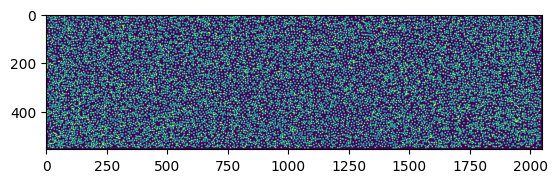

In [263]:
plt.imshow(mask_bw)

The above is a mask for both black and white particles. Since we did not check distance between black and white, there might be problems. For example, when particles overlap, larger connected regions can appear, and we lose some particles due to this. <font color="blue"> We can apply distance check in the whole tracking result to avoid this problem. </font>

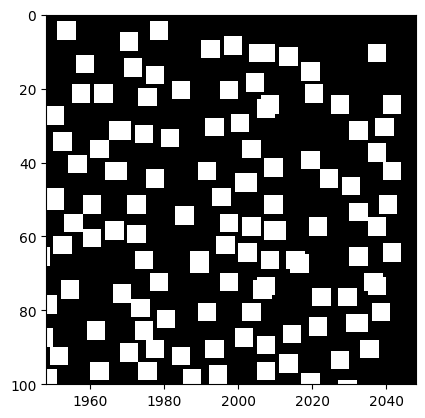

In [264]:
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(mask_bw[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))

In [265]:
label_img = measure.label(mask_bw)
regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "image_intensity")) # use raw image for computing properties
table = pd.DataFrame(regions)
table.head()

,label,centroid-0,centroid-1,image_intensity
0,1,5.000000,39.500000,"[[0, 7, 5, 11, 14, 17], [0, 11, 13, 16, 23, 16..."
1,2,3.000000,175.000000,"[[51, 43, 33, 23, 33], [68, 70, 65, 61, 55], [..."
2,3,7.364865,240.364865,"[[10, 10, 8, 8, 17, 0, 0, 0, 0, 0, 0, 0, 0, 0]..."
3,4,3.000000,374.000000,"[[46, 33, 20, 7, 8], [80, 59, 38, 21, 13], [11..."
4,5,5.250000,386.250000,"[[4, 2, 7, 16, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [266]:
table["stdev"] = table["image_intensity"].map(np.std)

<AxesSubplot: >

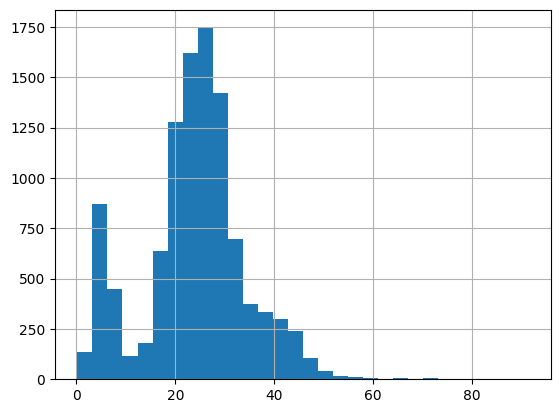

In [268]:
table["stdev"].hist(bins=30)

Beautiful two-peak histogram! The threshold value is roughly 15. We now go back to the old data `black` and `white` to implement the threshold and check the results

In [269]:
mask_b = np.zeros(img.shape)
for num, i in black.iterrows():
    rr, cc = draw.disk((i.y, i.x), 3)
    mask_b[rr, cc] = 1

In [270]:
label_img = measure.label(mask_b)
regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "image_intensity")) # use raw image for computing properties
table = pd.DataFrame(regions)
table.head()

,label,centroid-0,centroid-1,image_intensity
0,1,3.0,40.0,"[[7, 5, 11, 14, 17], [11, 13, 16, 23, 16], [13..."
1,2,3.0,175.0,"[[51, 43, 33, 23, 33], [68, 70, 65, 61, 55], [..."
2,3,3.0,236.0,"[[10, 10, 8, 8, 17], [14, 16, 13, 8, 33], [16,..."
3,4,3.0,374.0,"[[46, 33, 20, 7, 8], [80, 59, 38, 21, 13], [11..."
4,5,3.0,381.0,"[[4, 2, 7, 16, 19], [10, 5, 8, 20, 19], [8, 8,..."


In [276]:
table["stdev"] = table["image_intensity"].map(np.std)
black_valid = table.query("stdev < 15")

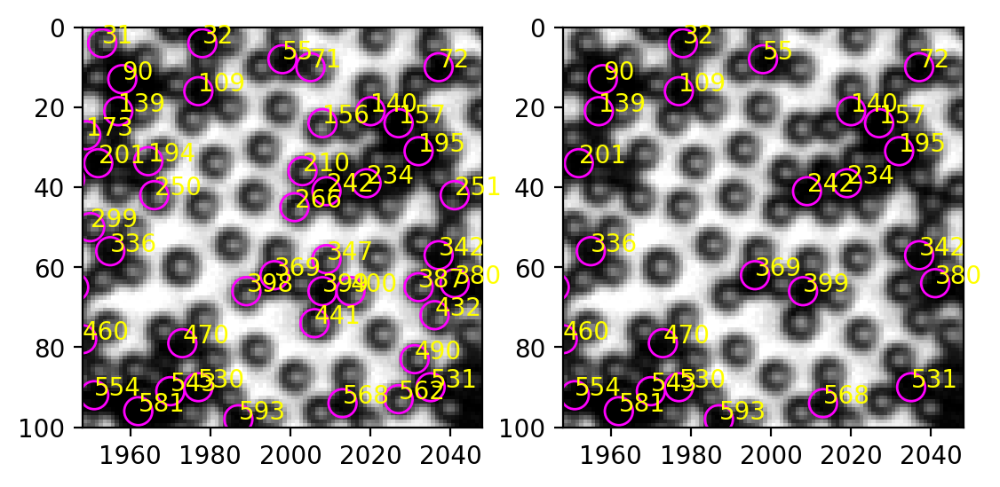

In [277]:
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(table["centroid-1"], table["centroid-0"])]
b = PatchCollection(b_circ, match_original=True)
left, right, bottom, top = 1948, 2048, 100, 0
fig, ax = plt.subplots(ncols=2, dpi=200)
ax[0].imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax[0].add_collection(b)
for num, i in table.iterrows():
    ax[0].annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="yellow")
    
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black_valid["centroid-1"], black_valid["centroid-0"])]
b = PatchCollection(b_circ, match_original=True)    
ax[1].imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax[1].add_collection(b)
for num, i in black_valid.iterrows():
    ax[1].annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="yellow")

In the upper right corner, most white particles are excluded, while all the black particles are retained.

##### Other criteria

Since standard deviation works, we currently don't need more. I put a section here to hold the place for future development.

### 1.2 White false positive

Apart from misclassifying white particles as black, the old method also finds many false positives, particularly when looking for white particles. See example below. 

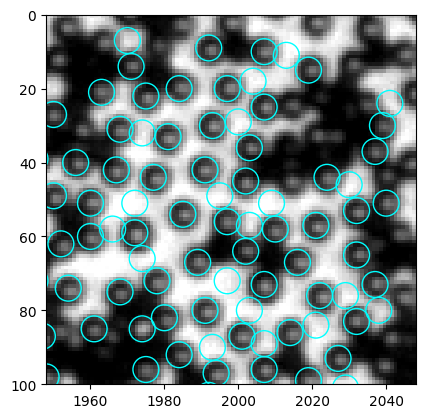

In [278]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)

In this specific region, the false positives are much brighter than the actual particles. However, the light inhomogeneity issue might again hinder the possibility of using mean intensity as the criterion. Let's take a look.

#### 1.2.1 Mean intensity

In [280]:
mask_w = np.zeros(img.shape)
for num, i in white.iterrows():
    rr, cc = draw.disk((i.y, i.x), 3)
    mask_w[rr, cc] = 1

In [282]:
label_img = measure.label(mask_w)
regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "intensity_mean", "image_intensity")) # use raw image for computing properties
table = pd.DataFrame(regions)
table.head()

,label,centroid-0,centroid-1,intensity_mean,image_intensity
0,1,5.0,149.0,62.80,"[[38, 51, 57, 55, 54], [46, 90, 106, 87, 57], ..."
1,2,5.0,168.0,220.40,"[[255, 253, 236, 206, 184], [255, 255, 250, 23..."
2,3,5.0,193.0,103.00,"[[78, 78, 93, 83, 58], [71, 96, 128, 134, 86],..."
3,4,5.0,362.0,108.76,"[[115, 99, 98, 98, 103], [102, 122, 125, 100, ..."
4,5,5.0,423.0,94.92,"[[84, 83, 84, 81, 100], [76, 106, 119, 87, 70]..."


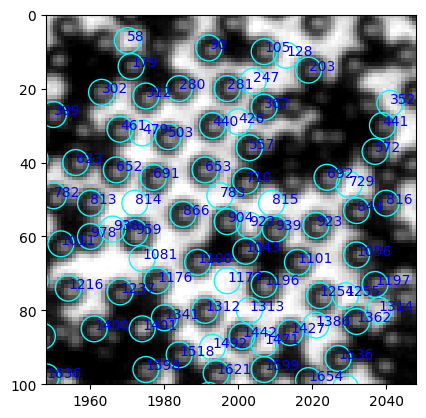

In [284]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)
for num, i in table.iterrows():
    ax.annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="blue")

In [285]:
table.query("label in [729, 692]")

,label,centroid-0,centroid-1,intensity_mean,image_intensity
691,692,44.0,2024.0,75.88,"[[17, 33, 42, 40, 48], [39, 74, 99, 86, 78], [..."
728,729,46.0,2030.0,224.64,"[[155, 206, 234, 234, 217], [171, 228, 239, 23..."


The mean intensity is very different between a false positive and a particle. We should also check the center of the image, where the light is brighter.

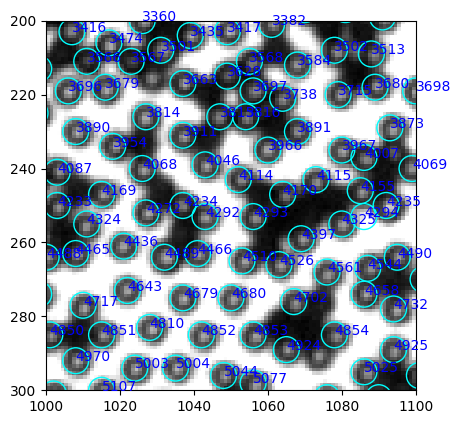

In [286]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1000, 1100, 300, 200
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)
for num, i in table.iterrows():
    ax.annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="blue")

The center has less problems of false positive. Let's compare 4325 and 4294.

In [287]:
table.query("label in [4325, 4294]")

,label,centroid-0,centroid-1,intensity_mean,image_intensity
4293,4294,253.0,1086.0,218.52,"[[179, 187, 194, 177, 128], [196, 225, 238, 22..."
4324,4325,255.0,1080.0,110.60,"[[70, 87, 102, 92, 106], [84, 130, 162, 122, 1..."


The false positive is still way brighter!

The overall histogram of mean intensity is plotted below.

array([[<AxesSubplot: title={'center': 'intensity_mean'}>]], dtype=object)

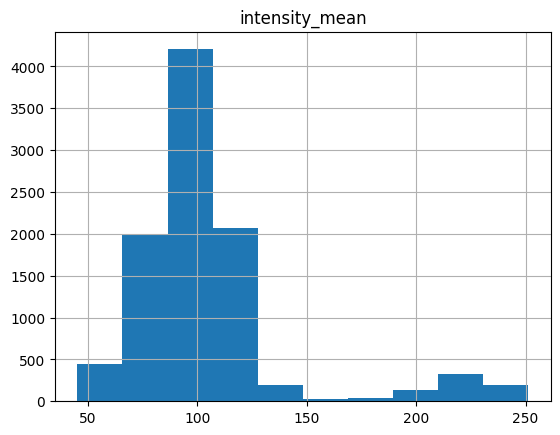

In [288]:
table.hist("intensity_mean")

Two peaks already, easy... The threshold is around 170, consistent with previous observation.

In [289]:
white_valid = table.query("intensity_mean < 170")

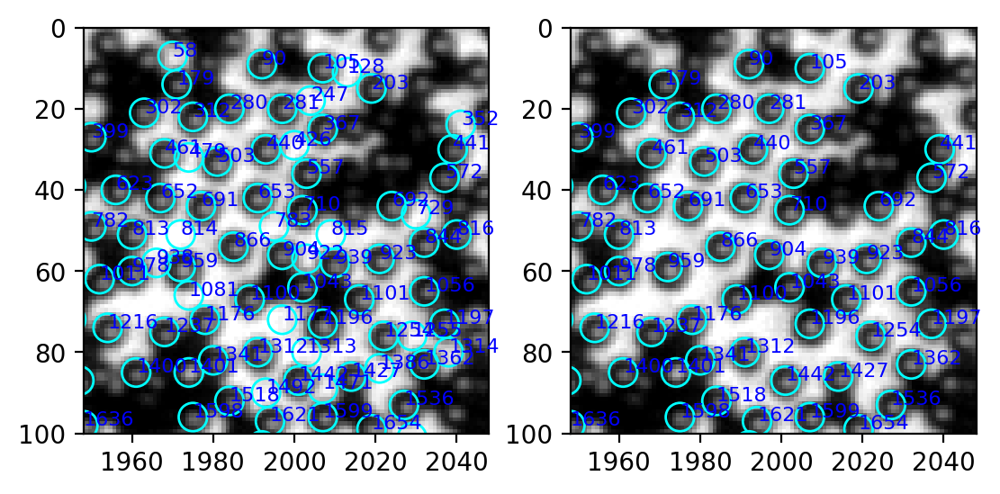

In [296]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(ncols=2, dpi=200)
left, right, bottom, top = 1948, 2048, 100, 0
ax[0].imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax[0].add_collection(w)
for num, i in table.iterrows():
    ax[0].annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="blue", fontsize=8)

w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white_valid["centroid-1"], white_valid["centroid-0"])]
w = PatchCollection(w_circ, match_original=True)
ax[1].imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax[1].add_collection(w)
for num, i in white_valid.iterrows():
    ax[1].annotate(int(i.label), (i["centroid-1"], i["centroid-0"]), xycoords="data", color="blue", fontsize=8)

## 2 Improve efficiency

The code runs unexpectly slow. On my computer, each frame takes 3 minutes, only to give an unsatisfactory result. Let's try to improve the speed.

### 2.1 Which step is slow?

It turns out that the slowest step is **the loop for computing intensity sum**. In this example, it takes 1m16s. This can be easily improved by the `regionprops` method we already used in the previous section. 

We modify the function to receive two threshold values for both mean intensity and standard deviation. The function also plots histograms for mean intensity and standard deviation to help us determine good threshold values. 

In [406]:
def find_black(img, size=7, thres=None, std_thres=None, plot_hist=False):
    """
    Find black particles in 乔哥's image. 
    
    :param img: raw image to find particles in 
    :type img: 2d array
    :param size: diameter of particle (px)
    :type size: int
    :param thres: threshold of mean intensity for discerning black and white particles. If None, the function will plot a histogram of mean intensity to help us.
    :type thres: int
    :param std_thres: threshold of standard deviation for discerning black and white particles. If None, the function will plot a histogram of standard deviation to help us.
    
    .. note::
    
       If ``thres=None`` or ``std_thres=None``, all detected features will be returned. Histograms of mean intensity and standard deviation will be plotted to help us set the threshold.

    :return: list of particle positions, pixel value sums and corr map peak values (x, y, pv, peak)
    :rtype: pandas.DataFrame
    
    .. rubric:: Edit
    
    * Nov 16, 2022: Initial commit.
    * Dec 09, 2022: Speed up by replacing the sum loop with ``regionprops``. Plot histograms to help setting threshold. Include distance check.
    """
    
    img = to8bit(img) # convert to 8-bit and saturate
    inv_img = 255 - img
    
    # generate gaussian template according to particle size
    gauss_shape = (size, size)
    gauss_sigma = size / 2.   
    gauss_mask = matlab_style_gauss2D(shape=gauss_shape,sigma=gauss_sigma) # 这里的shape是particle的直径，单位px
    

    timg = convolve2d(inv_img, gauss_mask, mode="same") 
    corr = normxcorr2(gauss_mask, timg, "same") # 找匹配mask的位置
    peak = FastPeakFind(corr) # 无差别找峰
    
    # apply min_dist criterion
    particles = pd.DataFrame({"x": peak[1], "y": peak[0]})
    # 加入corr map峰值，为后续去重合服务
    particles["peak"] = corr[particles.y, particles.x]
    particles = min_dist_criterion(particles, size)
    
    # 计算mask内的像素值的均值和标准差
    ## Create mask with feature regions as 1
    R = size / 2.
    mask = np.zeros(img.shape)
    for num, i in particles.iterrows():
        rr, cc = draw.disk((i.y, i.x), 0.8*R) # 0.8 to avoid overlap
        mask[rr, cc] = 1
        
    ## generate labeled image and construct regionprops
    label_img = measure.label(mask)
    regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "intensity_mean", "image_intensity")) # use raw image for computing properties
    table = pd.DataFrame(regions)
    table["stdev"] = table["image_intensity"].map(np.std)
       
    if thres is not None and std_thres is not None:
        table = table.loc[(table["intensity_mean"] <= thres)&(table["stdev"] <= std_thres)]
    elif thres is None and std_thres is None:
        print("Threshold value(s) are missing, all detected features are returned.")        
    elif thres is not None and std_thres is None:
        print("Standard deviation threshold is not set, only apply mean intensity threshold")
        table = table.loc[table["intensity_mean"] <= thres]
    elif thres is None and std_thres is not None:
        print("Mean intensity threshold is not set, only apply standard deviation threshold")
        table = table.loc[table["stdev"] <= std_thres]
    
    if plot_hist == True:
        table.hist(column=["intensity_mean", "stdev"], bins=20)
        
    table = table.rename(columns={"centroid-0": "y", "centroid-1": "x"}).drop(columns=["image_intensity"])
    
    return table

Here is how to use the function.

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)


Threshold value(s) are missing, all detected features are returned.
CPU times: total: 6.64 s
Wall time: 6.66 s


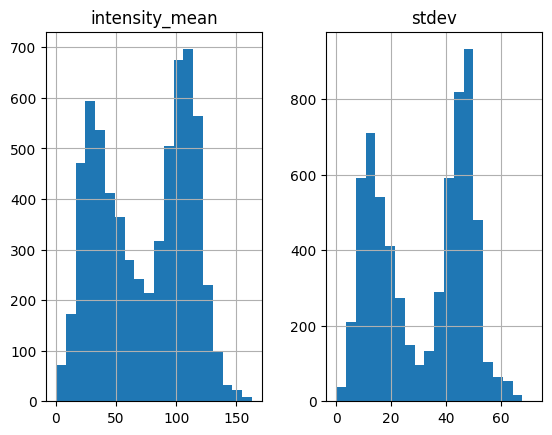

In [411]:
%%time
black = find_black(img, plot_hist=True)

We first notice that the function now is significantly faster than the old version (6.66 s vs. 1m16s). This 8.55 s have already incorporate distance check, which takes about 5 s. <font color="blue"> It's possible to optimize distance check, too. I will investigate later. </font>

Keep in mind that white particles have larger standard deviation. The histogram above suggests that we should set `std_thres=30`.

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)


Mean intensity threshold is not set, only apply standard deviation threshold


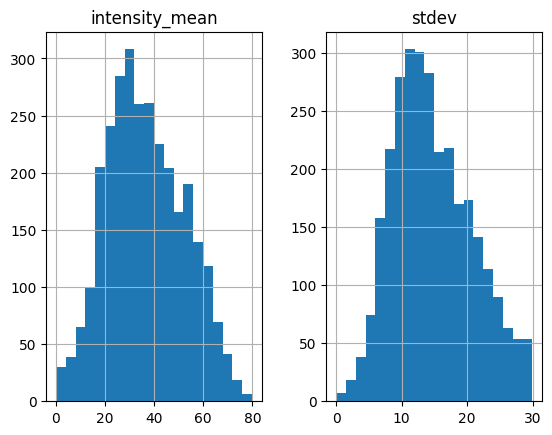

In [412]:
black = find_black(img, size=7, std_thres=30, plot_hist=True)

No obvious separation is identified in the new histogram. So let's check the results. <font color="red"> NOTE: although up to now we always find two-peak histograms, it is not necessarily always the case. And even if we don't see two-peak, it does not mean the criteria fail. In cases where you don't find double peak, you can play with both threshold and compare results to see if intensity_mean and stdev are still good criteria. </font>

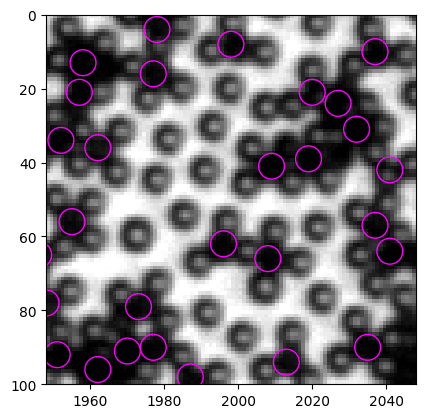

In [400]:
b_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black.x, black.y)]
b = PatchCollection(b_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(b)

We can compare old method with new method. <font color="red"> Since the original old method is too slow because of the for loop, I provide a modified version, which runs much faster but produces same results. </font>

In [401]:
def find_black_old(img, size=7, thres=None):
    """
    Find black particles in 乔哥's image. 
    
    :param img: raw image to find particles in 
    :type img: 2d array
    :param size: diameter of particle (px)
    :type size: int
    :param thres: threshold for discerning black and white particles. By default, ``thres`` is inferred from the data as mean of the median and the mean of pixel sums of all the particles. However, it is preferred to set a threshold manually, with the knowledge of the specific data.
    :type thres: int
    :return: list of particle positions, pixel value sums and corr map peak values (x, y, pv, peak)
    :rtype: pandas.DataFrame
    
    .. rubric:: Edit
    
    :Nov 16, 2022: Initial commit.
    """
    img = to8bit(img) # convert to 8-bit and saturate
    inv_img = 255 - img
    
    # generate gaussian template according to particle size
    gauss_shape = (size, size)
    gauss_sigma = size / 2.   
    gauss_mask = matlab_style_gauss2D(shape=gauss_shape,sigma=gauss_sigma) # 这里的shape是particle的直径，单位px
    
    timg = convolve2d(inv_img, gauss_mask, mode="same") 
    corr = normxcorr2(gauss_mask, timg, "same") # 找匹配mask的位置
    peak = FastPeakFind(corr) # 无差别找峰

    return pd.DataFrame({"x": peak[1], "y": peak[0]})

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)


Mean intensity threshold is not set, only apply standard deviation threshold


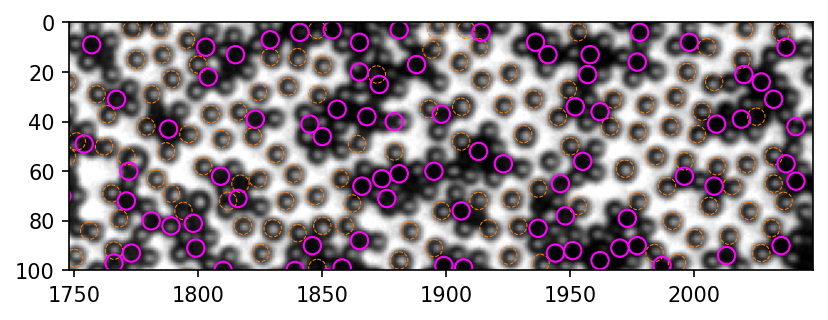

In [408]:
black_old = find_black_old(img)
black_old = min_dist_criterion(black_old, 7)
black_new = find_black(img, std_thres=30)

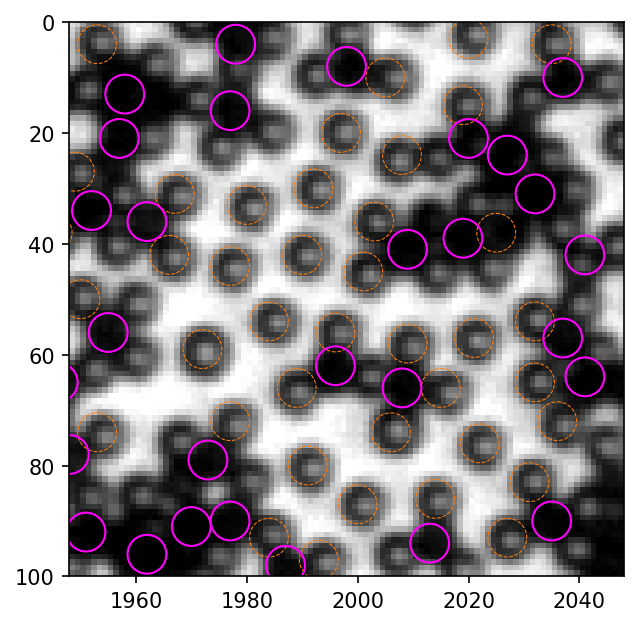

In [410]:
fig, ax = plt.subplots(dpi=150)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
old_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=.5, linestyle="--", fill=False, ec=bestcolor(1)) for xi, yi in zip(black_old.x, black_old.y)]
old = PatchCollection(old_circ, match_original=True)
new_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="magenta") for xi, yi in zip(black_new.x, black_new.y)]
new = PatchCollection(new_circ, match_original=True)
ax.add_collection(old)
ax.add_collection(new)

### 2.2 New `find_white`

We can modify `find_white` in a similar way to speed it up, and to provide histogram for thresholding.

In [420]:
def find_white_old(img, size=7, thres=None):
    
    img = to8bit(img) # convert to 8-bit and saturate
    
    mh = mexican_hat(shape=(5,5), sigma=0.8) # 这里shape和上面同理，sigma需要自行尝试一下，1左右
    #plt.imshow(mh, cmap="gray")

    corr = normxcorr2(mh, img, "same")
    coordinates = peak_local_max(corr, min_distance=5) 
    
    ## Rule out black ones
    Y, X = np.mgrid[0:img.shape[0], 0:img.shape[1]] 
    R = 3.5 
    pixel_sum_new_list = []
    for y, x in coordinates:
        mask = (X - x) ** 2 + (Y - y) ** 2 < R ** 2
        pv = img[mask].sum()
        pixel_sum_new_list.append(pv)

    particles = pd.DataFrame({"x": coordinates.T[1], "y": coordinates.T[0], "pv": pixel_sum_new_list})
    
    if thres == None:
        thres = (particles.pv.median() + particles.pv.mean()) / 4
        
    return particles.loc[particles.pv >= thres]

In [413]:
def find_white(img, size=7, thres=None, std_thres=None, plot_hist=False):
    
    img = to8bit(img) # convert to 8-bit and saturate
    
    mh = mexican_hat(shape=(5,5), sigma=0.8) # 这里shape和上面同理，sigma需要自行尝试一下，1左右
    #plt.imshow(mh, cmap="gray")

    corr = normxcorr2(mh, img, "same")
    coordinates = peak_local_max(corr, min_distance=5) 
    
    # apply min_dist criterion
    particles = pd.DataFrame({"x": coordinates.T[1], "y": coordinates.T[0]})
    # 加入corr map峰值，为后续去重合服务
    particles["peak"] = corr[particles.y, particles.x]
    particles = min_dist_criterion(particles, size)
    
    # 计算mask内的像素值的均值和标准差
    ## Create mask with feature regions as 1
    R = size / 2.
    mask = np.zeros(img.shape)
    for num, i in particles.iterrows():
        rr, cc = draw.disk((i.y, i.x), 0.8*R) # 0.8 to avoid overlap
        mask[rr, cc] = 1

    ## generate labeled image and construct regionprops
    label_img = measure.label(mask)
    regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "intensity_mean", "image_intensity")) # use raw image for computing properties
    table = pd.DataFrame(regions)
    table["stdev"] = table["image_intensity"].map(np.std)
       
    if thres is not None and std_thres is not None:
        table = table.loc[(table["intensity_mean"] <= thres)&(table["stdev"] <= std_thres)]
    elif thres is None and std_thres is None:
        print("Threshold value(s) are missing, all detected features are returned.")        
    elif thres is not None and std_thres is None:
        print("Standard deviation threshold is not set, only apply mean intensity threshold")
        table = table.loc[table["intensity_mean"] <= thres]
    elif thres is None and std_thres is not None:
        print("Mean intensity threshold is not set, only apply standard deviation threshold")
        table = table.loc[table["stdev"] <= std_thres]
    
    if plot_hist == True:
        table.hist(column=["intensity_mean", "stdev"], bins=20)

    table = table.rename(columns={"centroid-0": "y", "centroid-1": "x"}).drop(columns=["image_intensity"])

    return table

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: invalid value encountered in divide
  out = out / np.sqrt(image * template)


Threshold value(s) are missing, all detected features are returned.


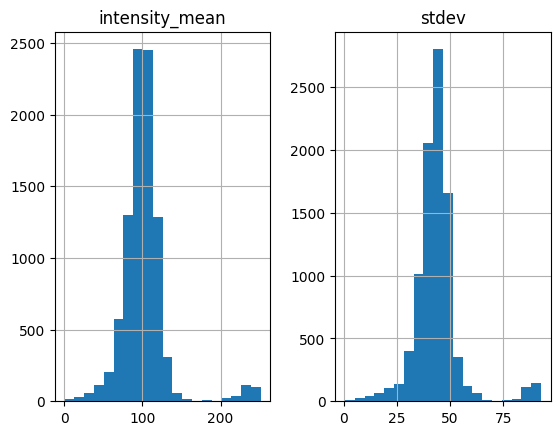

In [415]:
white = find_white(img, plot_hist=True)

Let's look at the results to identify problems.

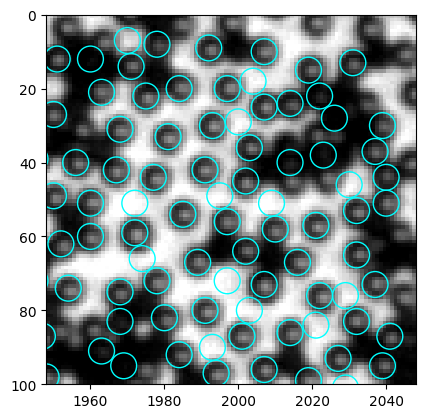

In [416]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)

We have discussed before, that mean intensity is a good criterion to discern particle and empty space, in that particles are much darker. And from the intensity histogram, we clearly see a peak at large intensity. Therefore, we set `thres=200`.

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: invalid value encountered in divide
  out = out / np.sqrt(image * template)


Standard deviation threshold is not set, only apply mean intensity threshold


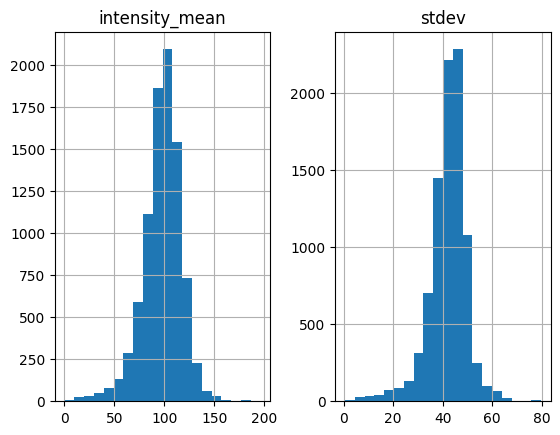

In [417]:
white = find_white(img, size=7, thres=200, plot_hist=True)

Let's see if the features in empty space are eliminated.

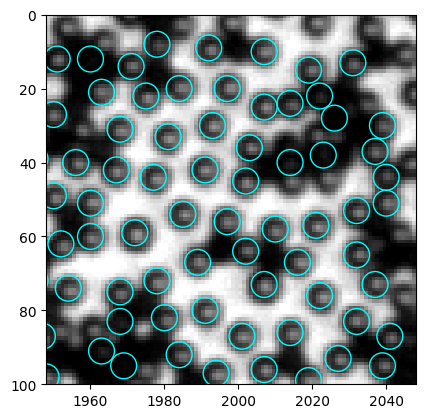

In [418]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)

Here we have a problem. The code finds some black particles too, but from the histogram I can hardly think of a good way to filter out the black.

In the old `find_white` function, we made `thres` the lower bound of mean intensity. This has effectively eliminated black particles, but is not able to deal with empty space. The way we set default lower bound is somewhat heuristic, but still far from robust:
```python
if thres == None:
        thres = (particles.pv.median() + particles.pv.mean()) / 4
```
<font color="blue">For now, let's keep this lower bound in the code. But keep in mind, if any problem occurs, it's likely due to this lower bound. It need to be optimized.</font>

In [422]:
def find_white(img, size=7, thres=None, std_thres=None, plot_hist=False):
    
    img = to8bit(img) # convert to 8-bit and saturate
    
    mh = mexican_hat(shape=(5,5), sigma=0.8) # 这里shape和上面同理，sigma需要自行尝试一下，1左右
    #plt.imshow(mh, cmap="gray")

    corr = normxcorr2(mh, img, "same")
    coordinates = peak_local_max(corr, min_distance=5) 
    
    # apply min_dist criterion
    particles = pd.DataFrame({"x": coordinates.T[1], "y": coordinates.T[0]})
    # 加入corr map峰值，为后续去重合服务
    particles["peak"] = corr[particles.y, particles.x]
    particles = min_dist_criterion(particles, size)
    
    # 计算mask内的像素值的均值和标准差
    ## Create mask with feature regions as 1
    R = size / 2.
    mask = np.zeros(img.shape)
    for num, i in particles.iterrows():
        rr, cc = draw.disk((i.y, i.x), 0.8*R) # 0.8 to avoid overlap
        mask[rr, cc] = 1

    ## generate labeled image and construct regionprops
    label_img = measure.label(mask)
    regions = measure.regionprops_table(label_img, intensity_image=img, properties=("label", "centroid", "intensity_mean", "image_intensity")) # use raw image for computing properties
    table = pd.DataFrame(regions)
    table["stdev"] = table["image_intensity"].map(np.std)
    
    ## Arbitrary lower bound here, be careful!
    intensity_lb = (table["intensity_mean"].median() + table["intensity_mean"].mean()) / 4
    table = table.loc[table["intensity_mean"]>=intensity_lb]
    
    if thres is not None and std_thres is not None:
        table = table.loc[(table["intensity_mean"] <= thres)&(table["stdev"] <= std_thres)]
    elif thres is None and std_thres is None:
        print("Threshold value(s) are missing, all detected features are returned.")        
    elif thres is not None and std_thres is None:
        print("Standard deviation threshold is not set, only apply mean intensity threshold")
        table = table.loc[table["intensity_mean"] <= thres]
    elif thres is None and std_thres is not None:
        print("Mean intensity threshold is not set, only apply standard deviation threshold")
        table = table.loc[table["stdev"] <= std_thres]
    
    if plot_hist == True:
        table.hist(column=["intensity_mean", "stdev"], bins=20)
    
    table = table.rename(columns={"centroid-0": "y", "centroid-1": "x"}).drop(columns=["image_intensity"])

    return table

C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: divide by zero encountered in divide
  out = out / np.sqrt(image * template)
C:\Users\liuzy\Documents\Github\mylib\xcorr_funcs.py:42: RuntimeWarning: invalid value encountered in divide
  out = out / np.sqrt(image * template)


Standard deviation threshold is not set, only apply mean intensity threshold


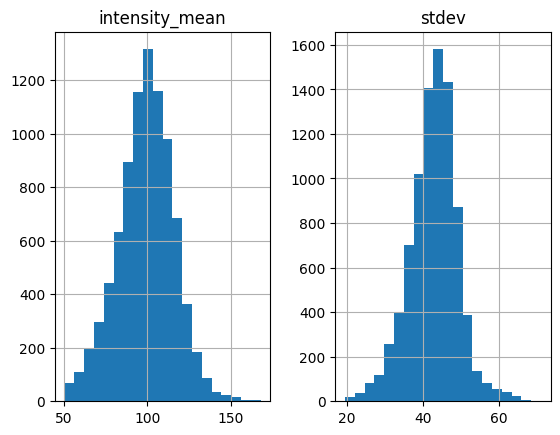

In [425]:
white = find_white(img, size=7, thres=170, plot_hist=True)

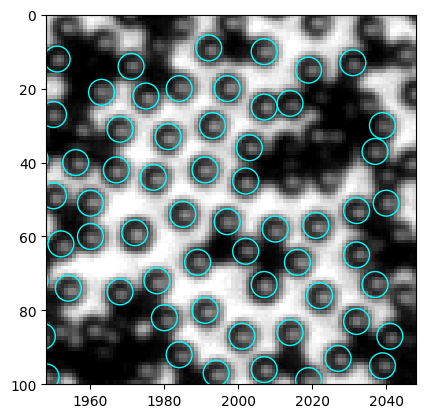

In [426]:
w_circ = [plt.Circle((xi, yi), radius=3.5, linewidth=1, fill=False, ec="cyan") for xi, yi in zip(white.x, white.y)]
w = PatchCollection(w_circ, match_original=True)
fig, ax = plt.subplots(dpi=100)
left, right, bottom, top = 1948, 2048, 100, 0
ax.imshow(img[top:bottom, left:right], cmap="gray", extent=(left, right, bottom, top))
ax.add_collection(w)

The result looks good to me. So I go ahead to update the functions in the .py file.

## 3 Last remark

After this round of edit, the two functions `find_black` and `find_white` are largely repetitive, except the mask used. There should be a way to merge the two functions together and make the code more concise.